In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import os

In [6]:
files = os.listdir(r'C:\Users\rraj1\Desktop\Python Files\DataAnalytics_Projects\Uber_DA\Uber_Data')  
#'r' = raw string tells this is the exact path including all backslashes
files

['other-American_B01362.csv',
 'other-Carmel_B00256.csv',
 'other-Dial7_B00887.csv',
 'other-Diplo_B01196.csv',
 'other-Federal_02216.csv',
 'other-FHV-services_jan-aug-2015.csv',
 'other-Firstclass_B01536.csv',
 'other-Highclass_B01717.csv',
 'other-Lyft_B02510.csv',
 'other-Prestige_B01338.csv',
 'other-Skyline_B00111.csv',
 'Uber-Jan-Feb-FOIL.csv',
 'uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [7]:
#Taking only files containing Uber Raw data, ie, last 7 files excluding JanJune csv file
files = files[-7:]
files.remove('uber-raw-data-janjune-15.csv')
files

['uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [8]:
#Concatenate all files to form our complete dataset
path = r'C:\Users\rraj1\Desktop\Python Files\DataAnalytics_Projects\Uber_DA\Uber_Data'

data = pd.DataFrame()
for file in files:
    df=pd.read_csv(path+'/'+file)
    data = pd.concat([data,df])

In [9]:
data.shape

(4534327, 4)

In [10]:
data.head()

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512


In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4534327 entries, 0 to 1028135
Data columns (total 4 columns):
Date/Time    object
Lat          float64
Lon          float64
Base         object
dtypes: float64(2), object(2)
memory usage: 173.0+ MB


In [12]:
data.isnull().sum()

Date/Time    0
Lat          0
Lon          0
Base         0
dtype: int64

In [13]:
data['Date/Time'] = pd.to_datetime(data['Date/Time'], format="%m/%d/%Y %H:%M:%S")

In [16]:
data['weekday']=data['Date/Time'].dt.day_name()
data['day']=data['Date/Time'].dt.day
data['minute']=data['Date/Time'].dt.minute
data['month']=data['Date/Time'].dt.month
data['hour']=data['Date/Time'].dt.hour

In [17]:
data.head()

,Date/Time,Lat,Lon,Base,weekday,day,minute,month,hour
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,Tuesday,1,11,4,0
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,Tuesday,1,17,4,0
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,Tuesday,1,21,4,0
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,Tuesday,1,28,4,0
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,Tuesday,1,33,4,0


In [18]:
data['weekday'].value_counts()

Thursday     755145
Friday       741139
Wednesday    696488
Tuesday      663789
Saturday     646114
Monday       541472
Sunday       490180
Name: weekday, dtype: int64

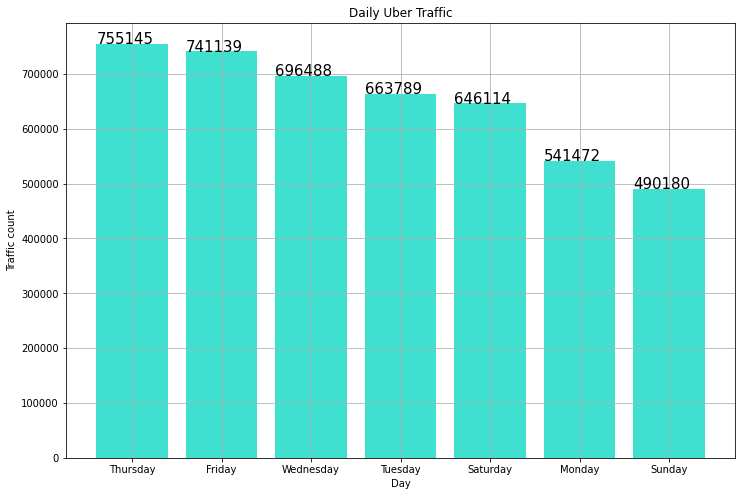

In [19]:
#Plot to visualize UBER's daily traffic

x = data['weekday'].value_counts().index
y = data['weekday'].value_counts()

plt.figure(figsize=(12,8))
bars = plt.bar(x,y, color='turquoise', width=0.8)
plt.grid()
plt.title('Daily Uber Traffic')
plt.xlabel('Day')
plt.ylabel('Traffic count')
#plt.plot(x, y, linewidth='2.0', color='black', marker='o', markersize='6')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x(), yval+0.15, yval, fontsize=15)

#### Definitely, highest traffic faced by UBER is on Thursday and lowest traffic on Sunday

In [20]:
data['hour'].unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23], dtype=int64)

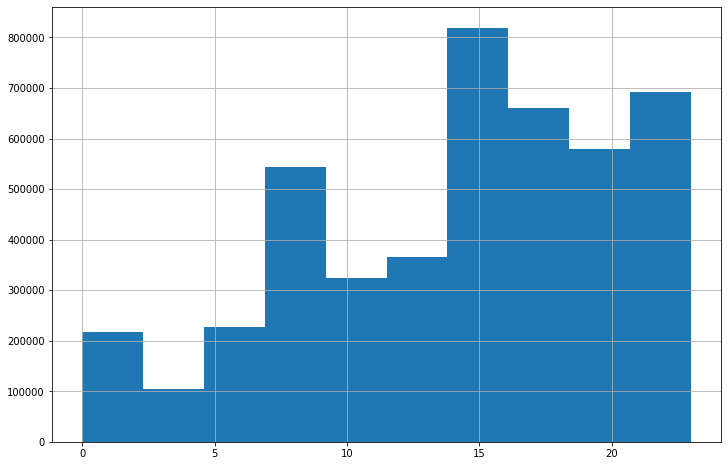

In [21]:
plt.figure(figsize=(12,8))
plt.hist(data['hour'])
plt.grid()

#### As expected, UBER Traffic generally peaks during night when people log off from their work, b/w 17:00-22:00 hrs

In [22]:
data['month'].value_counts()

9    1028136
8     829275
7     796121
6     663844
5     652435
4     564516
Name: month, dtype: int64

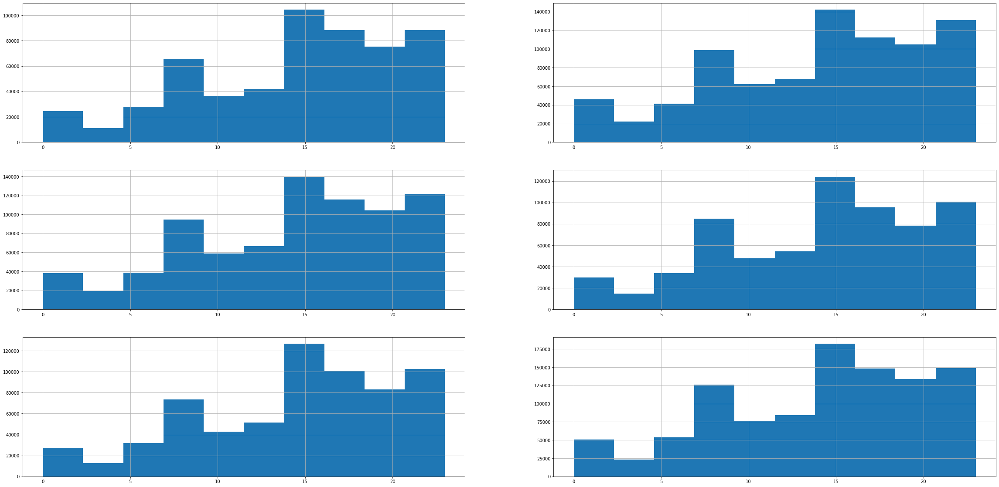

In [23]:
#Plot to compare peak hours for each month
fig, ax = plt.subplots(3,2, figsize=(40,20))

for i,month in enumerate(data['month'].unique()):
    plt.subplot(3,2,i+1)
    data[data['month']==month]['hour'].hist()

#### For all months, UBER traffic peaks during late hours only

In [24]:
data.groupby('month')['hour'].sum()

month
4     8165748
5     9448974
6     9386939
7    11321420
8    11658535
9    14488851
Name: hour, dtype: int64

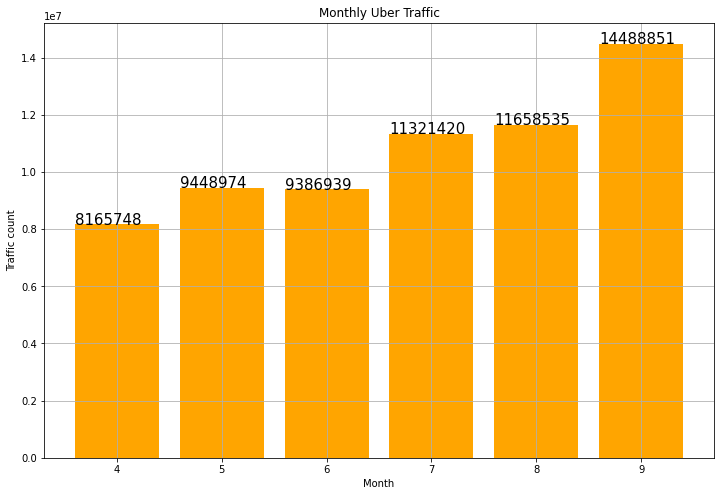

In [25]:
#Plot to visualize UBER's monthly traffic

x = data.groupby('month')['hour'].sum().index
y = data.groupby('month')['hour'].sum()

plt.figure(figsize=(12,8))
bars = plt.bar(x,y, color='orange', width=0.8)
plt.grid()
plt.title('Monthly Uber Traffic')
plt.xlabel('Month')
plt.ylabel('Traffic count')
#plt.plot(x, y, linewidth='2.0', color='black', marker='o', markersize='6')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x(), yval+0.15, yval, fontsize=15)

#### In the 9th month, ie, September, UBER records the highest traffic

In [26]:
data.head()

,Date/Time,Lat,Lon,Base,weekday,day,minute,month,hour
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,Tuesday,1,11,4,0
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,Tuesday,1,17,4,0
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,Tuesday,1,21,4,0
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,Tuesday,1,28,4,0
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,Tuesday,1,33,4,0


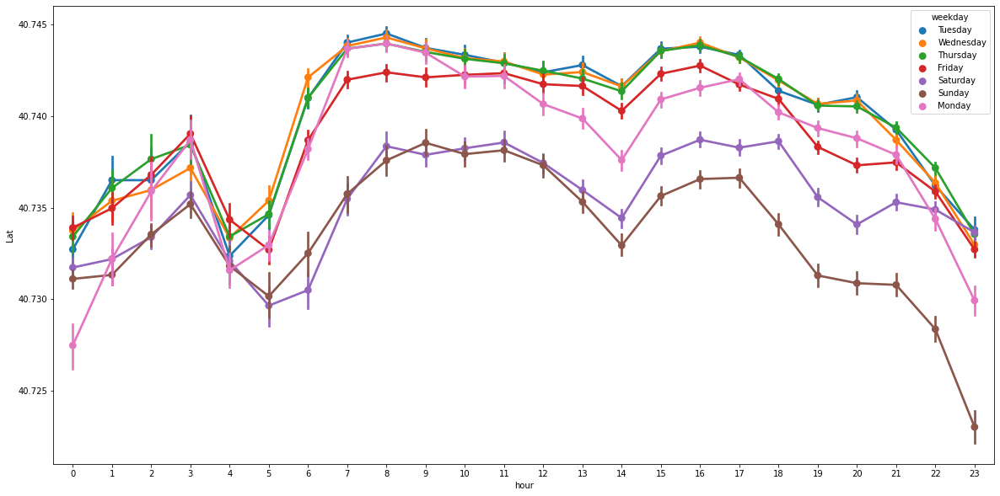

In [27]:
#Rush every hour of day with pickup Latitude of passenger
plt.figure(figsize=(20,10))
sns.pointplot(x='hour', y='Lat', hue='weekday', data=data)

#### We can analyze from above pointplot that lowest traffic is on Sunday, and highest traffic from Tuesday-Thursday.
#### Also, we can visualize from here max traffic for a particular day has been from what location and during which hour of the day, that can be very useful for creating business insights and plan future decisions

In [28]:
data['Base'].value_counts()

B02617    1458853
B02598    1393113
B02682    1212789
B02764     263899
B02512     205673
Name: Base, dtype: int64

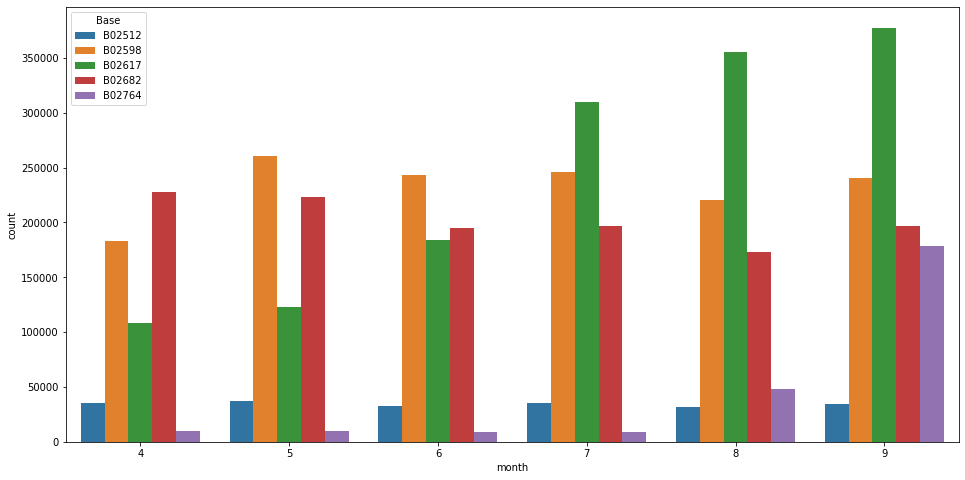

In [29]:
##Visualizing variation of each Base popularity by each month - 1
plt.figure(figsize=(16,8))
sns.countplot(x='month', hue='Base', data=data)

In [30]:
base = data.groupby(['Base','month'])['Date/Time'].count().reset_index()
base

,Base,month,Date/Time
0,B02512,4,35536
1,B02512,5,36765
2,B02512,6,32509
3,B02512,7,35021
4,B02512,8,31472
5,B02512,9,34370
6,B02598,4,183263
7,B02598,5,260549
8,B02598,6,242975
9,B02598,7,245597


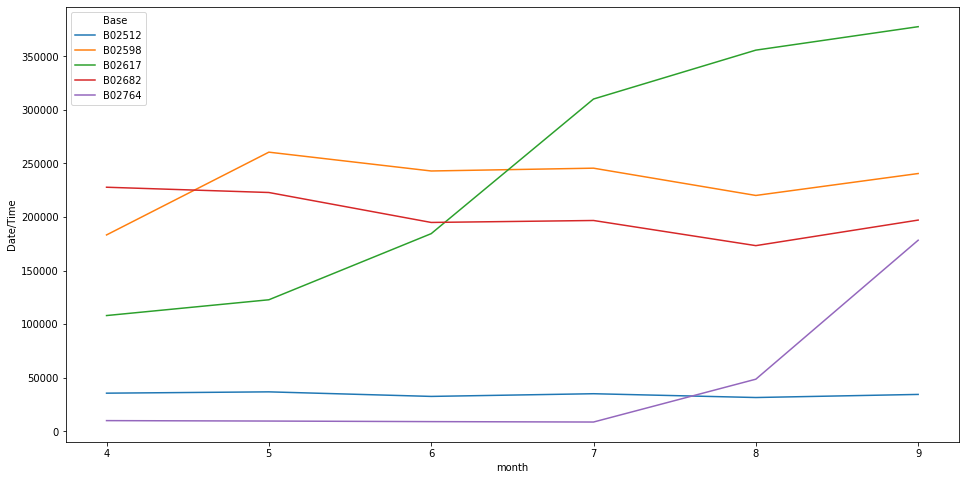

In [31]:
#Visualizing variation of each Base popularity by each month - 2
plt.figure(figsize=(16,8))
sns.lineplot(x='month',y='Date/Time',hue='Base',data=base)

#### Above Lineplot shows popularity of base 'B02617' increases in later months while that of base 'BO2512' remains constant throughout 6 months

In [32]:
x = data.groupby(['weekday','hour'])['Date/Time'].count()
x

weekday    hour
Friday     0       13716
           1        8163
           2        5350
           3        6930
           4        8806
                   ...  
Wednesday  19      47017
           20      47772
           21      44553
           22      32868
           23      18146
Name: Date/Time, Length: 168, dtype: int64

In [33]:
pivot = x.unstack()
pivot

hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
weekday,,,,,,,,,,,,,,,,,,,,,
Friday,13716,8163,5350,6930,8806,13450,23412,32061,31509,25230,...,36206,43673,48169,51961,54762,49595,43542,48323,49409,41260
Monday,6436,3737,2938,6232,9640,15032,23746,31159,29265,22197,...,28157,32744,38770,42023,37000,34159,32849,28925,20158,11811
Saturday,27633,19189,12710,9542,6846,7084,8579,11014,14411,17669,...,31418,38769,43512,42844,45883,41098,38714,43826,47951,43174
Sunday,32877,23015,15436,10597,6374,6169,6596,8728,12128,16401,...,28151,31112,33038,31521,28291,25948,25076,23967,19566,12166
Thursday,9293,5290,3719,5637,8505,14169,27065,37038,35431,27812,...,36699,44442,50560,56704,55825,51907,51990,51953,44194,27764
Tuesday,6237,3509,2571,4494,7548,14241,26872,36599,33934,25023,...,34846,41338,48667,55500,50186,44789,44661,39913,27712,14869
Wednesday,7644,4324,3141,4855,7511,13794,26943,36495,33826,25635,...,35148,43388,50684,55637,52732,47017,47772,44553,32868,18146


In [34]:
#Build Functions to check relationship b/w different Date/Time parameters
def count_rows(rows):
    return len(rows)

def heatmap(col1, col2):
    cross_table = data.groupby([col1,col2]).apply(count_rows)
    pivot = cross_table.unstack()
    plt.figure(figsize=(16,8))
    return sns.heatmap(pivot, annot=False, cmap="YlGnBu")

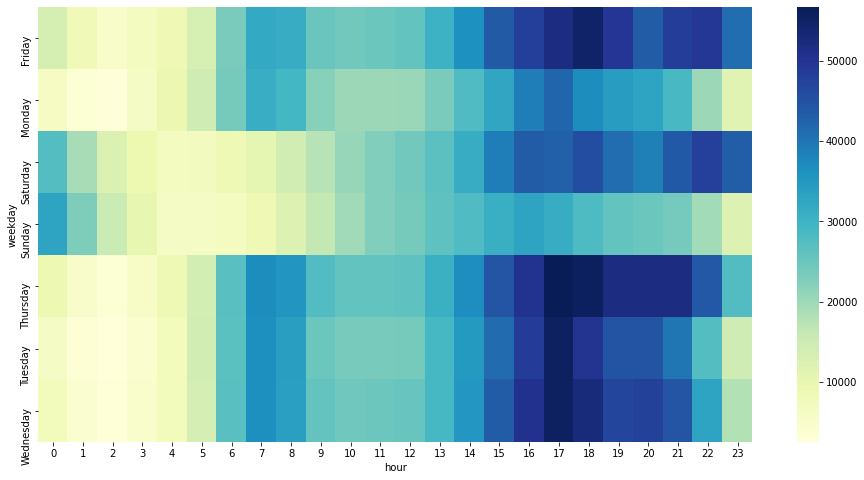

In [35]:
heatmap('weekday','hour')

#### On each day of week, maximum traffic is late hours in evening

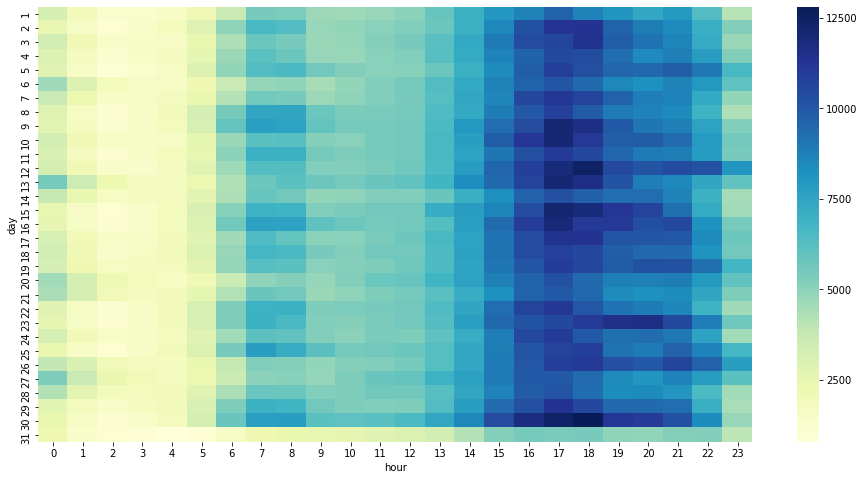

In [36]:
heatmap('day','hour')

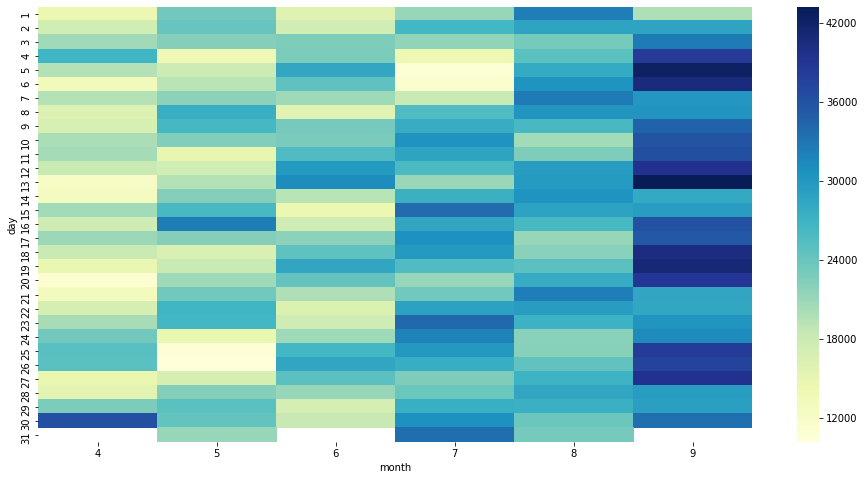

In [37]:
heatmap('day','month')

#### Number of Trips increased each month, so we can say from April to September, UBER was in a continuous improvement process

In [38]:
data.head()

,Date/Time,Lat,Lon,Base,weekday,day,minute,month,hour
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,Tuesday,1,11,4,0
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,Tuesday,1,17,4,0
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,Tuesday,1,21,4,0
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,Tuesday,1,28,4,0
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,Tuesday,1,33,4,0


(40.6, 41.0)

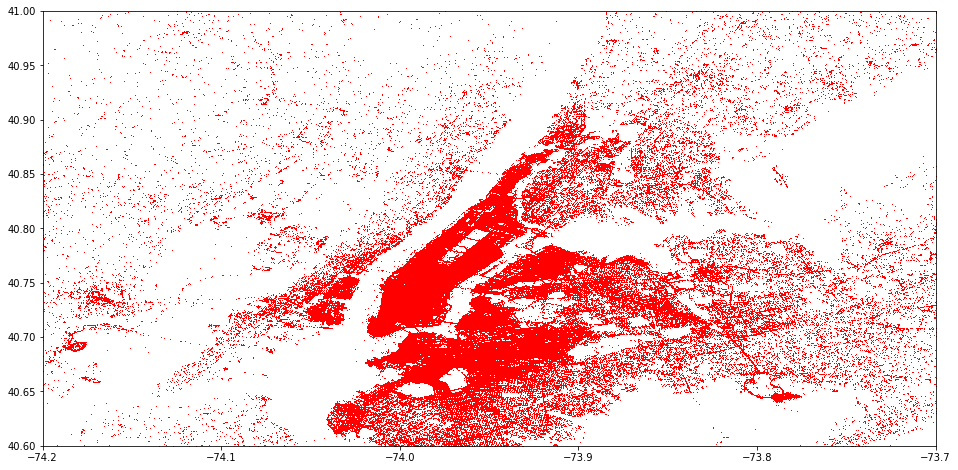

In [39]:
#Analysis of Lat/Long data points
plt.figure(figsize=(16,8))

plt.plot(data['Lon'],data['Lat'], 'r+', ms=0.5)
#Removing Outliers
plt.xlim(-74.2, -73.7)
plt.ylim(40.6,41)

#### We can observe the number of heatpoints here and the particular location areas where there has been hoge demand for the given period

### Spatial Analysis using heatmap to analyse clear cut rush on Sunday on Map

In [42]:
data_sun = data[data['weekday']=='Sunday']
data_sun

,Date/Time,Lat,Lon,Base,weekday,day,minute,month,hour
6965,2014-04-06 00:00:00,40.6547,-74.3033,B02512,Sunday,6,0,4,0
6966,2014-04-06 00:00:00,40.7356,-74.0006,B02512,Sunday,6,0,4,0
6967,2014-04-06 00:00:00,40.7421,-74.0041,B02512,Sunday,6,0,4,0
6968,2014-04-06 00:00:00,40.7401,-74.0053,B02512,Sunday,6,0,4,0
6969,2014-04-06 00:01:00,40.7368,-73.9877,B02512,Sunday,6,1,4,0
...,...,...,...,...,...,...,...,...,...
1014138,2014-09-28 23:57:00,40.6447,-73.7821,B02764,Sunday,28,57,9,23
1014139,2014-09-28 23:57:00,40.7513,-73.9941,B02764,Sunday,28,57,9,23
1014140,2014-09-28 23:57:00,40.6875,-74.1824,B02764,Sunday,28,57,9,23
1014141,2014-09-28 23:57:00,40.6482,-73.7823,B02764,Sunday,28,57,9,23


In [43]:
rush = data_sun.groupby(['Lat','Lon'])['weekday'].count().reset_index()
rush

,Lat,Lon,weekday
0,39.9374,-74.0722,1
1,39.9378,-74.0721,1
2,39.9384,-74.0742,1
3,39.9385,-74.0734,1
4,39.9415,-74.0736,1
...,...,...,...
209225,41.3141,-74.1249,1
209226,41.3180,-74.1298,1
209227,41.3195,-73.6905,1
209228,41.3197,-73.6903,1


In [44]:
import folium
from folium.plugins import HeatMap
basemap=folium.Map()

In [45]:
HeatMap(rush, zoom=20, radius=15).add_to(basemap)
basemap

In [46]:
#Automating above steps
def plot(day):
    basemap=folium.Map()
    data_day = data[data['weekday']==day]
    rush = data_day.groupby(['Lat','Lon'])['weekday'].count().reset_index()
    HeatMap(rush, zoom=20, radius=15).add_to(basemap)
    return basemap

In [47]:
plot('Thursday')